# Neural-conditioned Generation — Semantic decoder → InstantX IP-Adapter

Tests the **semantic-only** decoding path from the proposal:
neural IT responses → predicted SigLIP embedding → FLUX.1-dev + pretrained InstantX IP-Adapter.

**Spatial path not engaged yet** — spatial decoder ridge R² is near zero, so `init_image` is always the ground-truth stimulus.  Varying `strength` controls how much the adapter repainted versus how much the init latent bleeds through.

Conditions compared on the **val split**:
1. **Neural-only** — predicted SigLIP embedding, empty prompt, ip_scale > 0
2. **GT-embedding (ceiling)** — ground-truth SigLIP from cache, same ip_scale
3. **Text-only** — BLIP-2 short caption, ip_scale = 0
4. **Neural + text** — predicted SigLIP + BLIP-2 caption
5. **Control** — no semantic conditioning at all

In [1]:
import sys, os, json
from pathlib import Path


import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

sys.path.insert(0, '.')
from config_const import (
    CHECKPOINT_DIR, BLIP2_CAPTIONS_PATH, BLIP2_DETAILED_CAPTIONS_PATH,
    RUST_STIM_DIR, N_STIMULI, N_TRAIN, N_VAL, SEED,
    SIGLIP_EMBEDDINGS_PATH, SIGLIP_DIM,
)
from data_utils.rust_loader import make_rust_loader
from encoders import BottleneckMLP, TemporalLSTM, TemporalTransformer
from eval.metrics import two_afc_identification
from generation.flux_instantx import load_pipeline, generate_img2img
from get_device import get_device

## 1. Data — split, captions, ground-truth SigLIP

In [2]:
rng  = np.random.default_rng(SEED)
perm = rng.permutation(N_STIMULI)
train_idx = perm[:N_TRAIN].tolist()
val_idx   = perm[N_TRAIN : N_TRAIN + N_VAL].tolist()
test_idx  = perm[N_TRAIN + N_VAL :].tolist()
print(f"train: {len(train_idx)}  val: {len(val_idx)}  test: {len(test_idx)}")

with open(BLIP2_CAPTIONS_PATH) as f:
    captions = {int(k): v for k, v in json.load(f).items()}
with open(BLIP2_DETAILED_CAPTIONS_PATH) as f:
    detailed_captions = {int(k): v for k, v in json.load(f).items()}
print(f"Captions: {len(captions)} short, {len(detailed_captions)} detailed")

# Ground-truth SigLIP embeddings (300, 1152) — pooler output, L2-normalised
siglip_gt = torch.load(SIGLIP_EMBEDDINGS_PATH, weights_only=True)   # (300, 1152)
print(f"GT SigLIP: {tuple(siglip_gt.shape)}")

def load_stimulus(stim_idx: int) -> Image.Image:
    return Image.open(RUST_STIM_DIR / f"{stim_idx:04d}.png").convert("RGB")

train: 200  val: 50  test: 50
Captions: 300 short, 300 detailed
GT SigLIP: (300, 1152)
GT SigLIP: (300, 1152)


## 2. Load best semantic decoder and predict SigLIP embeddings

In [3]:
train_loader, val_loader, test_loader = make_rust_loader(batch_size=256, use_embeddings=True)
sample_neural, _ = next(iter(train_loader))
_, n_neurons, n_time = sample_neural.shape
print(f"Neural: {n_neurons} neurons × {n_time} time bins")

Loading Rust sessions: 100%|██████████| 19/19 [00:23<00:00,  1.21s/it]
/home/yy3658/HexPred/object_response/get_rust_response.py:175: RuntimeWarning: Mean of empty slice
  avg_data[i] = np.nanmean(all_data[i], axis=0)
Loading Rust sessions: 100%|██████████| 10/10 [00:17<00:00,  1.75s/it]


RUST loaders created: train=200, val=50, test=50, neurons=6802, time=25, target=(1152,)
Neural: 6802 neurons × 25 time bins


In [4]:
# Scan all semantic decoder checkpoints and rank by val 2AFC
import pandas as pd

def _scan_checkpoints(root: Path):
    rows = []
    for pt in root.glob('**/best.pt'):
        parent_dir = pt.parts[-3]  # checkpoints/<model_type>/<run_name>/best.pt
        if parent_dir not in ('mlp', 'lstm', 'transformer'):
            continue
        try:
            ckpt = torch.load(pt, weights_only=False, map_location='cpu')
            m = ckpt.get('metrics', {})
            rows.append(dict(
                path=pt,
                model_type=parent_dir,
                run=pt.parent.name,
                val_2afc=m.get('val_2afc', float('nan')),
                val_loss=m.get('val_loss', float('nan')),
                args=ckpt.get('args', {}),
            ))
        except Exception as e:
            print(f'  skip {pt}: {e}')
    return sorted(rows, key=lambda r: -r['val_2afc'])

sem_ckpts = _scan_checkpoints(CHECKPOINT_DIR)
print(f"Found {len(sem_ckpts)} semantic decoder checkpoints")
df_ckpts = pd.DataFrame([{k: v for k, v in r.items() if k != 'path' and k != 'args'} for r in sem_ckpts])
print(df_ckpts.head(15).to_string(index=False))

Found 71 semantic decoder checkpoints
model_type                                          run  val_2afc  val_loss
       mlp   bn128_do0.3_lr0.001_wd0.1_tn0.0_bs64_t0.07  0.848980  3.100570
       mlp  bn256_do0.3_lr0.001_wd0.01_tn0.0_bs64_t0.07  0.848571  3.129429
       mlp  bn256_do0.1_lr0.001_wd0.01_tn0.0_bs64_t0.07  0.846122  3.131137
       mlp  bn128_do0.3_lr0.001_wd0.01_tn0.0_bs64_t0.07  0.845714  3.101815
       mlp  bn256_do0.3_lr0.0003_wd0.1_tn0.0_bs64_t0.07  0.842449  3.141523
       mlp  bn256_do0.1_lr0.0003_wd0.1_tn0.0_bs64_t0.07  0.840408  3.142949
       mlp bn256_do0.1_lr0.0003_wd0.01_tn0.0_bs64_t0.07  0.840408  3.143774
       mlp bn256_do0.3_lr0.0003_wd0.01_tn0.0_bs64_t0.07  0.838776  3.135622
       mlp   bn256_do0.1_lr0.001_wd0.1_tn0.0_bs64_t0.07  0.837551  3.133399
       mlp  bn128_do0.1_lr0.001_wd0.01_tn0.0_bs64_t0.07  0.837551  3.132868
       mlp   bn128_do0.1_lr0.001_wd0.1_tn0.0_bs64_t0.07  0.835510  3.133415
       mlp   bn256_do0.3_lr0.001_wd0.1_tn0.0_bs64_

In [5]:
# Load the best checkpoint
best_row  = sem_ckpts[0]
model_type = best_row['model_type']
saved_args = best_row['args']
print(f"Best: {best_row['path']}")
print(f"  model={model_type}  val_2afc={best_row['val_2afc']:.4f}")
print(f"  args: {saved_args}")

if model_type == 'mlp':
    model = BottleneckMLP(
        in_dim=n_neurons * n_time,
        bottleneck=saved_args.get('bottleneck', 128),
        out_dim=SIGLIP_DIM,
        dropout=saved_args.get('dropout', 0.1),
    )
elif model_type == 'lstm':
    model = TemporalLSTM(
        n_neurons=n_neurons,
        hidden=saved_args.get('hidden', 128),
        out_dim=SIGLIP_DIM,
        dropout=saved_args.get('dropout', 0.1),
    )
else:  # transformer
    model = TemporalTransformer(
        n_neurons=n_neurons,
        d_model=saved_args.get('d_model', 64),
        n_heads=saved_args.get('n_heads', 4),
        n_layers=saved_args.get('n_layers', 1),
        out_dim=SIGLIP_DIM,
        dropout=saved_args.get('dropout', 0.1),
    )

ckpt_state = torch.load(best_row['path'], weights_only=False, map_location='cpu')
model.load_state_dict(ckpt_state['model_state'])
model.eval()
print(f"Loaded: {sum(p.numel() for p in model.parameters()):,} params")

Best: /home/yy3658/NeurObjectGen/checkpoints/mlp/bn128_do0.3_lr0.001_wd0.1_tn0.0_bs64_t0.07/best.pt
  model=mlp  val_2afc=0.8490
  args: {'model': 'mlp', 'bottleneck': 128, 'hidden': 128, 'd_model': 64, 'n_heads': 4, 'n_layers': 2, 'dropout': 0.3, 'target_noise': 0.0, 'epochs': 150, 'batch_size': 64, 'lr': 0.001, 'weight_decay': 0.1, 'temperature': 0.07}
Loaded: 21,915,392 params


In [6]:
def predict_embeddings(loader, model, model_type):
    """Run the semantic decoder on a DataLoader and return (pred, gt) tensors."""
    preds, gts = [], []
    model.eval()
    with torch.no_grad():
        for neural, siglip in loader:
            x = neural.flatten(1) if model_type == 'mlp' else neural.permute(0, 2, 1)
            preds.append(model(x).cpu())
            gts.append(siglip.cpu())
    return torch.cat(preds), torch.cat(gts)

pred_train, gt_train = predict_embeddings(train_loader, model, model_type)
pred_val,   gt_val   = predict_embeddings(val_loader,   model, model_type)
pred_test,  gt_test  = predict_embeddings(test_loader,  model, model_type)

afc_val  = two_afc_identification(pred_val,  gt_val)
afc_test = two_afc_identification(pred_test, gt_test)
cos_val  = F.cosine_similarity(pred_val,  gt_val).mean().item()
cos_test = F.cosine_similarity(pred_test, gt_test).mean().item()
print(f"Val  2AFC={afc_val:.4f}  cos={cos_val:.4f}")
print(f"Test 2AFC={afc_test:.4f}  cos={cos_test:.4f}")

Val  2AFC=0.8490  cos=0.1952
Test 2AFC=0.8184  cos=0.1855


## 3. Quantitative evaluation — neural vs ground-truth embeddings

Four conditions compared on **train / val / test** splits:

| Condition | Embedding source | Space |
|-----------|-----------------|-------|
| `neural → siglip` | best semantic decoder | SigLIP 1152-d |
| `neural → clip` | best CLIP decoder | CLIP 768-d |
| `oracle siglip` | ground-truth cache | SigLIP 1152-d |
| `oracle clip` | ground-truth cache | CLIP 768-d |

Metrics: **2-AFC identification accuracy** (chance = 0.5) and **mean cosine similarity**.

In [7]:
# ---------------------------------------------------------------------------
# Load best encoder per target (siglip already loaded above as `model`),
# load best clip encoder, and evaluate all four conditions on all splits.
# ---------------------------------------------------------------------------
from config_const import CLIP_EMBEDS_PATH, CLIP_DIM

# ── Ground-truth embeddings (300 × D, L2-normalised) ──────────────────────
import torch.nn.functional as F

clip_gt    = F.normalize(torch.load(CLIP_EMBEDS_PATH,       weights_only=True), dim=-1)
siglip_gt_norm = F.normalize(siglip_gt, dim=-1)

# Split index arrays (same perm as training)
import numpy as np
_rng  = np.random.default_rng(SEED)
_perm = _rng.permutation(N_STIMULI)
split_idx = {
    "train": _perm[:N_TRAIN].tolist(),
    "val":   _perm[N_TRAIN : N_TRAIN + N_VAL].tolist(),
    "test":  _perm[N_TRAIN + N_VAL :].tolist(),
}

# GT embeddings per split
gt_splits = {
    "siglip": {s: siglip_gt_norm[split_idx[s]] for s in split_idx},
    "clip":   {s: clip_gt[split_idx[s]]         for s in split_idx},
}

# ── Load best CLIP encoder ────────────────────────────────────────────────
from encoders import BottleneckMLP, TemporalLSTM, TemporalTransformer
import pandas as pd

def _best_ckpt_for_target(tgt: str):
    """Return (model_obj, model_type) for the top val-2AFC checkpoint of target."""
    from config_const import CHECKPOINT_DIR
    rows = []
    for model_name in ("mlp", "lstm", "transformer"):
        pt_dir = CHECKPOINT_DIR / model_name / tgt
        if not pt_dir.exists():
            pt_dir = CHECKPOINT_DIR / model_name
        for pt in sorted(pt_dir.glob("*/best.pt")):
            try:
                ckpt = torch.load(pt, weights_only=False, map_location="cpu")
            except Exception:
                continue
            if "metrics" not in ckpt:
                continue
            args = ckpt["args"]
            if args.get("target", tgt) != tgt:
                continue
            rows.append((ckpt["metrics"]["val_2afc"], pt, ckpt))
    if not rows:
        raise FileNotFoundError(f"No checkpoints found for target={tgt}")
    rows.sort(key=lambda x: -x[0])
    best_2afc, best_pt, best_ckpt = rows[0]
    args = best_ckpt["args"]
    mt   = args["model"]
    out_dim = {"siglip": SIGLIP_DIM, "clip": CLIP_DIM}[tgt]
    if mt == "mlp":
        m = BottleneckMLP(in_dim=n_neurons*n_time, bottleneck=args["bottleneck"],
                          out_dim=out_dim, dropout=args["dropout"])
    elif mt == "lstm":
        m = TemporalLSTM(n_neurons=n_neurons, hidden=args["hidden"],
                         out_dim=out_dim, n_layers=args.get("n_layers",1),
                         dropout=args["dropout"])
    else:
        m = TemporalTransformer(n_neurons=n_neurons, d_model=args["d_model"],
                                n_heads=args["n_heads"], n_layers=args["n_layers"],
                                out_dim=out_dim, dropout=args["dropout"])
    m.load_state_dict(best_ckpt["model_state"])
    m.eval()
    print(f"  target={tgt}  model={mt}  val_2afc={best_2afc:.4f}  → {best_pt.name}")
    return m, mt


print("Loading best encoders...")
enc_siglip, mt_siglip = model, model_type          # already loaded above
enc_clip,   mt_clip   = _best_ckpt_for_target("clip")

# ── Predict from neural data on each split ────────────────────────────────
@torch.no_grad()
def _predict(enc, mt, loader):
    preds = []
    for neural, _ in loader:
        x = neural.flatten(1) if mt == "mlp" else neural.permute(0, 2, 1)
        preds.append(enc(x).cpu())
    return torch.cat(preds)

neural_pred = {
    "siglip": {
        "train": _predict(enc_siglip, mt_siglip, train_loader),
        "val":   pred_val,     # already computed in cell-predict
        "test":  pred_test,
    },
    "clip": {
        "train": _predict(enc_clip, mt_clip, train_loader),
        "val":   _predict(enc_clip, mt_clip, val_loader),
        "test":  _predict(enc_clip, mt_clip, test_loader),
    },
}

# ── Compute metrics ───────────────────────────────────────────────────────
records = []
for tgt in ("siglip", "clip"):
    for split in ("train", "val", "test"):
        pred  = neural_pred[tgt][split]
        gt    = gt_splits[tgt][split]
        records.append({
            "condition": f"neural→{tgt}",
            "target": tgt, "split": split,
            "2afc":    two_afc_identification(pred, gt),
            "cos_sim": F.cosine_similarity(pred, gt, dim=-1).mean().item(),
        })
    for split in ("train", "val", "test"):
        gt = gt_splits[tgt][split]
        records.append({
            "condition": f"oracle ({tgt})",
            "target": tgt, "split": split,
            "2afc":    two_afc_identification(gt, gt),
            "cos_sim": F.cosine_similarity(gt, gt, dim=-1).mean().item(),
        })

eval_df = pd.DataFrame(records)
display(
    eval_df.pivot_table(index=["target","condition"], columns="split",
                        values=["2afc","cos_sim"], aggfunc="first")
           [["2afc","cos_sim"]]
           .sort_index()
)


Loading best encoders...


/home/yy3658/miniconda3/envs/objGen/lib/python3.12/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  target=clip  model=transformer  val_2afc=0.6012  → best.pt


2afc                       cos_sim            \
split                       test     train       val      test     train   
target condition                                                           
clip   neural→clip      0.614694  0.502789  0.601224  0.034938  0.028618   
       oracle (clip)    1.000000  0.999698  1.000000  1.000000  1.000000   
siglip neural→siglip    0.818367  0.516005  0.848980  0.185511  0.023042   
       oracle (siglip)  1.000000  1.000000  1.000000  1.000000  1.000000   

                                  
split                        val  
target condition                  
clip   neural→clip      0.030046  
       oracle (clip)    1.000000  
siglip neural→siglip    0.195194  
       oracle (siglip)  1.000000

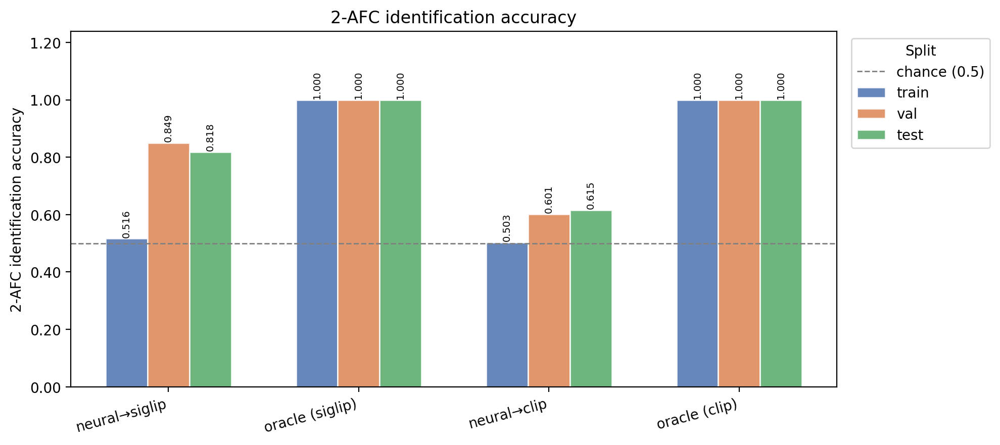

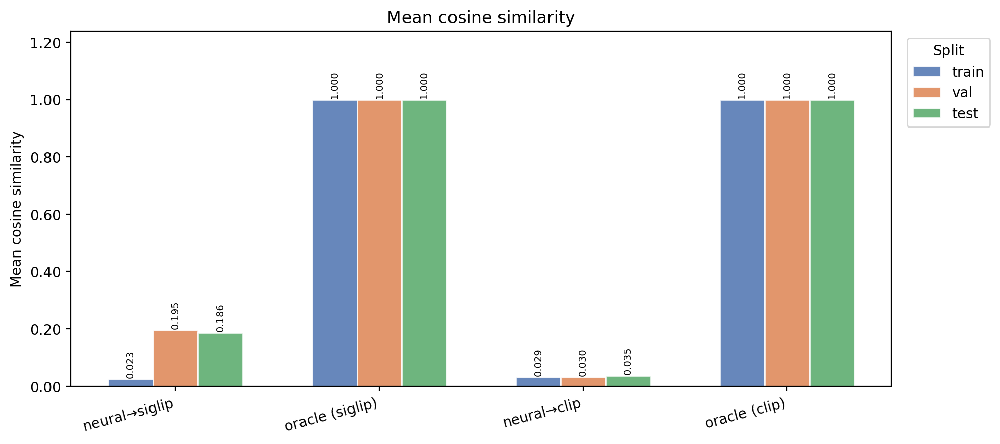

In [8]:
# ---------------------------------------------------------------------------
# Plot: 2AFC and cosine similarity — all four conditions × split
# ---------------------------------------------------------------------------
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

SPLITS       = ["train", "val", "test"]
SPLIT_COLORS = {"train": "#4c72b0", "val": "#dd8452", "test": "#55a868"}

for metric, ylabel in [("2afc", "2-AFC identification accuracy"),
                        ("cos_sim", "Mean cosine similarity")]:
    conditions = eval_df["condition"].unique().tolist()
    x     = np.arange(len(conditions))
    width = 0.22

    fig, ax = plt.subplots(figsize=(max(7, 2.5 * len(conditions)), 4.5))
    for i, split in enumerate(SPLITS):
        sub  = eval_df[eval_df["split"] == split].set_index("condition")
        vals = [sub.loc[c, metric] if c in sub.index else float("nan") for c in conditions]
        bars = ax.bar(x + (i-1)*width, vals, width,
                      label=split, color=SPLIT_COLORS[split], alpha=0.85, edgecolor="white")
        for bar, v in zip(bars, vals):
            if not (v != v):   # skip NaN
                ax.text(bar.get_x() + bar.get_width()/2, v + 0.005,
                        f"{v:.3f}", ha="center", va="bottom", fontsize=7, rotation=90)

    if metric == "2afc":
        ax.axhline(0.5, color="grey", lw=1, ls="--", label="chance (0.5)")
    ax.set_xticks(x)
    ax.set_xticklabels(conditions, rotation=15, ha="right")
    ax.set_ylabel(ylabel)
    ax.set_title(ylabel)
    ax.legend(title="Split", bbox_to_anchor=(1.01, 1), loc="upper left")
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.2f"))
    ax.set_ylim(0, ax.get_ylim()[1] * 1.18)
    plt.tight_layout()
    plt.show()


## 4. Load FLUX + InstantX IP-Adapter

In [9]:
device = get_device()
torch.cuda.empty_cache()
pipe, image_proj = load_pipeline(device=device, default_scale=1.0)
print("Pipeline ready")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Pipeline ready


## 5. Generate: five conditions across N_SHOW val stimuli

`init_image` = ground-truth stimulus resized to 512 × 512 (spatial path not engaged).
Adjust `STRENGTH` and `IP_SCALE` below.

In [10]:
N_SHOW    = 8      # number of val stimuli
STRENGTH  = 0.6   # img2img noise strength
IP_SCALE  = 1.0   # ip_adapter_scale for neural/GT conditions
NUM_STEPS = 20
IMAGE_SIZE = 512

In [11]:
results = []
zero_emb = torch.zeros(SIGLIP_DIM)  # null embedding for text-only / control

for i, stim_idx in enumerate(tqdm(val_idx[:N_SHOW], desc='Generating')):
    orig = load_stimulus(stim_idx).resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)
    caption  = captions[stim_idx]
    emb_neural = pred_val[i]          # predicted from neural responses
    emb_gt     = siglip_gt[stim_idx]  # ground-truth SigLIP

    shared = dict(
        height=IMAGE_SIZE, width=IMAGE_SIZE,
        num_inference_steps=NUM_STEPS,
        guidance_scale=3.5,
        strength=STRENGTH,
        seed=i,
        aperture_composite=True,
        show_progress=False,
    )

    gen_neural = generate_img2img(
        pipe, image_proj, orig, emb_neural,
        ip_adapter_scale=IP_SCALE, **shared)

    gen_gt = generate_img2img(
        pipe, image_proj, orig, emb_gt,
        ip_adapter_scale=IP_SCALE, **shared)

    gen_text = generate_img2img(
        pipe, image_proj, orig, zero_emb,
        ip_adapter_scale=0.0, prompt=caption, **shared)

    gen_neural_text = generate_img2img(
        pipe, image_proj, orig, emb_neural,
        ip_adapter_scale=IP_SCALE, prompt=caption, **shared)

    gen_control = generate_img2img(
        pipe, image_proj, orig, zero_emb,
        ip_adapter_scale=0.0, **shared)

    results.append(dict(
        stim_idx=stim_idx, orig=orig, caption=caption,
        neural=gen_neural, gt=gen_gt,
        text=gen_text, neural_text=gen_neural_text,
        control=gen_control,
    ))

Generating: 100%|██████████| 8/8 [03:06<00:00, 23.29s/it]


## 6. Plot: original | neural | GT (↑) | text-only | neural+text | control

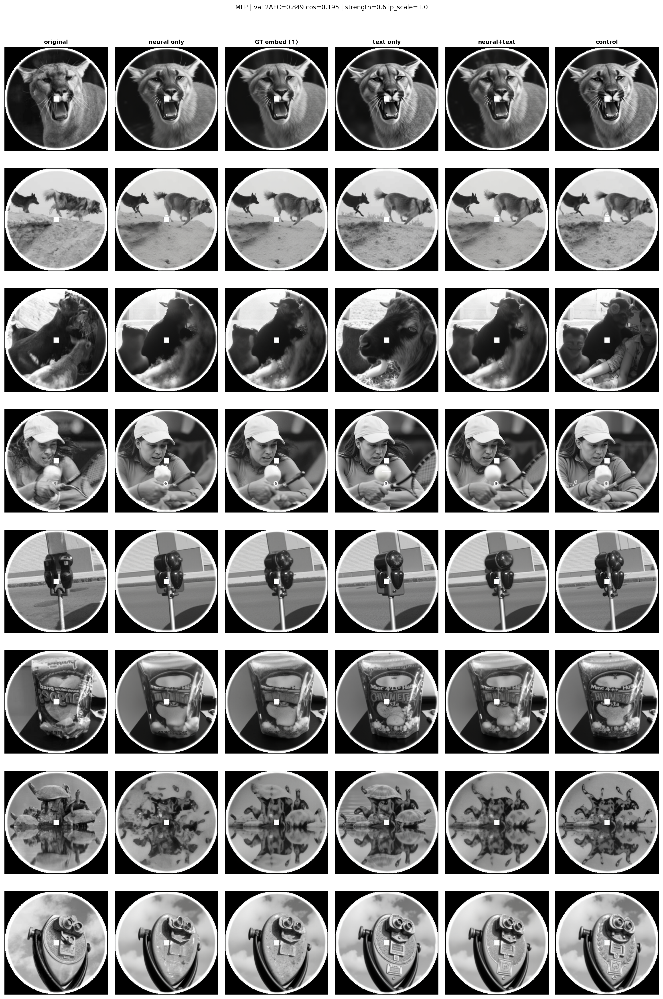

In [12]:
COLS       = ['orig', 'neural', 'gt', 'text', 'neural_text', 'control']
COL_LABELS = ['original', 'neural only', 'GT embed (↑)', 'text only', 'neural+text', 'control']

n = len(results)
fig, axes = plt.subplots(n, len(COLS), figsize=(len(COLS) * 2.5, n * 2.8))
if n == 1:
    axes = axes[None, :]
for ax in axes.flat:
    ax.axis('off')

for j, lbl in enumerate(COL_LABELS):
    axes[0, j].set_title(lbl, fontsize=9, fontweight='bold')

for i, r in enumerate(results):
    for j, col in enumerate(COLS):
        axes[i, j].imshow(r[col])
    axes[i, 0].set_ylabel(f"stim {r['stim_idx']}", fontsize=7)
    cap = r['caption']
    axes[i, COLS.index('text')].set_xlabel(
        cap[:45] + ('…' if len(cap) > 45 else ''), fontsize=6)

plt.suptitle(
    f"{model_type.upper()} | val 2AFC={afc_val:.3f} cos={cos_val:.3f} | "
    f"strength={STRENGTH} ip_scale={IP_SCALE}",
    fontsize=10, y=1.01,
)
plt.tight_layout()
plt.show()

## 7. Strength sweep sweep — neural vs GT on one stimulus

Helps calibrate how much the adapter contributes relative to init-latent bleed-through.

Strength sweep: 100%|██████████| 6/6 [01:01<00:00, 10.17s/it]


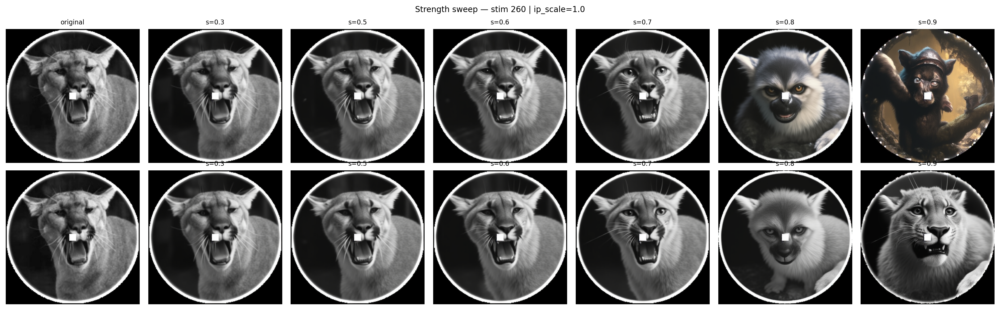

In [13]:
STRENGTHS      = [0.3, 0.5, 0.6, 0.7, 0.8, 0.9]
SWEEP_STIM_I   = 0   # index into val_idx

stim_idx  = val_idx[SWEEP_STIM_I]
orig_512  = load_stimulus(stim_idx).resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)
emb_n     = pred_val[SWEEP_STIM_I]
emb_g     = siglip_gt[stim_idx]

sweep_rows = []
for s in tqdm(STRENGTHS, desc='Strength sweep'):
    kw = dict(height=IMAGE_SIZE, width=IMAGE_SIZE, num_inference_steps=NUM_STEPS,
              guidance_scale=3.5, strength=s, seed=0,
              aperture_composite=True, show_progress=False)
    g_n = generate_img2img(pipe, image_proj, orig_512, emb_n, ip_adapter_scale=IP_SCALE, **kw)
    g_g = generate_img2img(pipe, image_proj, orig_512, emb_g, ip_adapter_scale=IP_SCALE, **kw)
    sweep_rows.append((s, g_n, g_g))

fig, axes = plt.subplots(2, len(STRENGTHS) + 1, figsize=((len(STRENGTHS)+1)*2.5, 5.5))
for ax in axes.flat:
    ax.axis('off')

for row_i, (row_label, col_i_start) in enumerate([('neural', 0), ('GT embed', 1)]):
    axes[row_i, 0].imshow(orig_512)
    axes[row_i, 0].set_title('original' if row_i == 0 else '', fontsize=8)
    axes[row_i, 0].set_ylabel(row_label, fontsize=8)

for j, (s, g_n, g_g) in enumerate(sweep_rows):
    axes[0, j+1].imshow(g_n); axes[0, j+1].set_title(f's={s}', fontsize=8)
    axes[1, j+1].imshow(g_g); axes[1, j+1].set_title(f's={s}', fontsize=8)

plt.suptitle(f'Strength sweep — stim {stim_idx} | ip_scale={IP_SCALE}', fontsize=10)
plt.tight_layout()
plt.show()

## 8. Train-set sanity check

Generate on training stimuli (seen during semantic decoder training).  
If neural and GT look similar here but not on val, the decoder is memorising rather than generalising.

Train sanity: 100%|██████████| 5/5 [00:46<00:00,  9.35s/it]


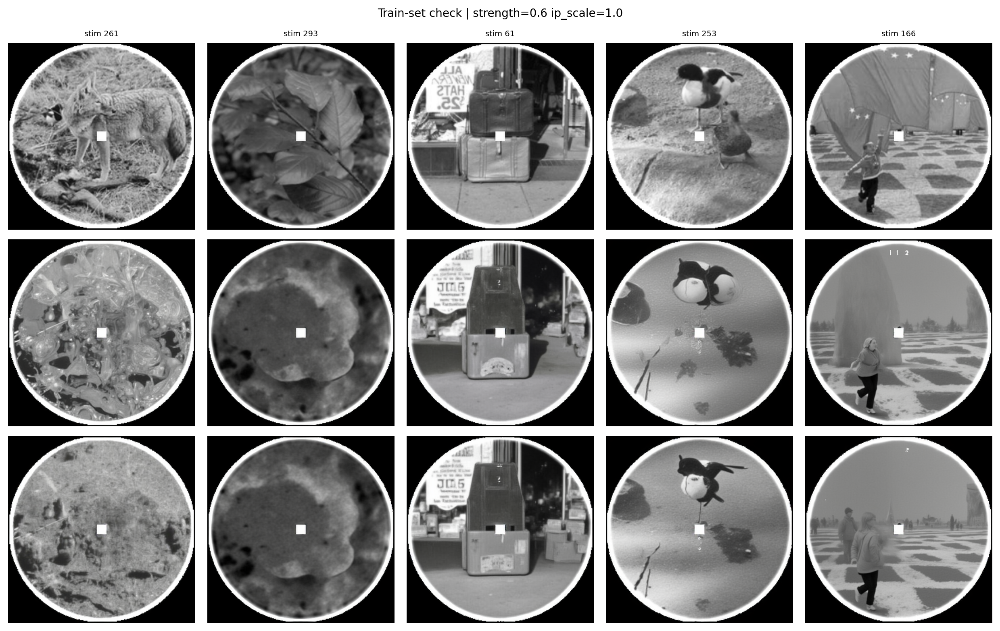

In [14]:
N_TRAIN_SHOW = 5
train_results = []

for i, stim_idx in enumerate(tqdm(train_idx[:N_TRAIN_SHOW], desc='Train sanity')):
    orig = load_stimulus(stim_idx).resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)
    shared = dict(height=IMAGE_SIZE, width=IMAGE_SIZE, num_inference_steps=NUM_STEPS,
                  guidance_scale=3.5, strength=STRENGTH, seed=i,
                  aperture_composite=True, show_progress=False)
    g_n = generate_img2img(pipe, image_proj, orig, pred_train[i],
                           ip_adapter_scale=IP_SCALE, **shared)
    g_g = generate_img2img(pipe, image_proj, orig, siglip_gt[stim_idx],
                           ip_adapter_scale=IP_SCALE, **shared)
    train_results.append((stim_idx, orig, g_n, g_g))

fig, axes = plt.subplots(3, N_TRAIN_SHOW, figsize=(N_TRAIN_SHOW * 2.5, 8))
for ax in axes.flat:
    ax.axis('off')
for j, lbl in enumerate(['original', 'neural', 'GT embed (↑)']):
    axes[j, 0].set_ylabel(lbl, fontsize=8)
for i, (stim_idx, orig, g_n, g_g) in enumerate(train_results):
    axes[0, i].imshow(orig);  axes[0, i].set_title(f'stim {stim_idx}', fontsize=7)
    axes[1, i].imshow(g_n)
    axes[2, i].imshow(g_g)

plt.suptitle(f'Train-set check | strength={STRENGTH} ip_scale={IP_SCALE}', fontsize=10)
plt.tight_layout()
plt.show()